<a href="https://colab.research.google.com/github/yujinshii/Hacking-Tools/blob/master/Data_Camp_analyzing_raster_and_vector_data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Urban heat island (UHI) mapping
SiiCaP Data Camp: analyzing raster and vector data

16 September 2022 - JFR - PhilSA HPCISD

---

# Objectives
- In this webinar, we will discuss the UHI effect along with its causes, threats posed to ecosystem and how can we monitor them
- Earth observation satellites used to analyze UHIs will be presented
  - Remote sensing of land surface temperature
  - *Satellites, sensors and spectral bands*
  - *Data access*
  - *Trade-off between spatial and temporal resolution*
- Lastly, we will try to analyze the UHI effect in Cabanatuan using satellite data from LANDSAT8/9 in conjunction with OSM data.

# Prerequisites

One must be able to load and process [raster](https://geohackweek.github.io/raster/) and [vector](https://geohackweek.github.io/vector/) datasets as discussed in last week's Data Camp. We will combine these techniques to complete our lab exercise.

# What is UHI?



Readings:
- [ARSET - Satellite Remote Sensing for Urban Heat Islands | NASA Applied Sciences](https://appliedsciences.nasa.gov/join-mission/training/english/arset-satellite-remote-sensing-urban-heat-islands)
- [NASA - Satellites Pinpoint Drivers of Urban Heat Islands in the Northeast](https://www.nasa.gov/topics/earth/features/heat-island-sprawl.html)
- [Can you explain the urban heat island effect? – Climate Change: Vital Signs of the Planet (nasa.gov)](https://climate.nasa.gov/faq/44/can-you-explain-the-urban-heat-island-effect/)
- [Climate Change and Heat Islands | US EPA](https://www.epa.gov/heatislands/climate-change-and-heat-islands)
- [Climate Change Indicators: U.S. and Global Temperature | US EPA](https://www.epa.gov/climate-indicators/climate-change-indicators-us-and-global-temperature)


Before we start our lab exercise, we need to install the necessary packages. When deploying in production, make sure to lock the versions to prevent compatibility issues among the package versions.

*Briefly describe libraries*

In [ ]:
!pip install graphviz==0.20.1
!pip install earthengine-api==0.1.323
!pip install rasterio==1.2.10
!pip install matplotlib==3.5.3
!pip install geopandas==0.10.2
!pip install utm==0.7.0
!pip install osmnx==1.1.2

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


# Lab Exercise

*Does a building exhibit lower surface temperatures when surrounded by green spaces?*


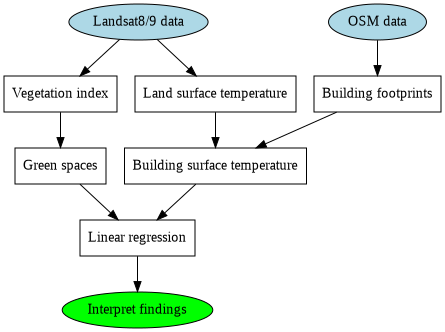

We need to determine appropriate data for green spaces and LST. First, we need to authenticate with GEE to use their API:

In [ ]:
# Initialize GEE API
import ee
ee.Authenticate()
ee.Initialize()

To authorize access needed by Earth Engine, open the following URL in a web browser and follow the instructions. If the web browser does not start automatically, please manually browse the URL below.

    https://code.earthengine.google.com/client-auth?scopes=https%3A//www.googleapis.com/auth/earthengine%20https%3A//www.googleapis.com/auth/devstorage.full_control&request_id=bM01E0_VmLoM1mWB5DMaQaxJF8YPU7c_wyvzPMDhfz8&tc=qlYvi3qj4nczBmNCtlyiH2TtawN1KgjmlLcqxhMarpA&cc=UD-MSi9A7sMUFbZR8-19nize2tLpSPROiUx_0vXq5lI

The authorization workflow will generate a code, which you should paste in the box below.
Enter verification code: 4/1ARtbsJqRQNA0JpUV59jkxsmJ9UH5qJv8fzbMc8k35G9a_hAX60PuIXS-vKI

Successfully saved authorization token.


Get imageries from [Google Earth Engine](https://developers.google.com/earth-engine/tutorials/community/intro-to-python-api#getting_started_with_collections). Provide necessary filters and sort by cloud pixel percentage in ascending order.

In [ ]:
L8_L2_collection = ee.ImageCollection("LANDSAT/LC08/C02/T1_L2") # from Landsat8
#L8_L2_collection = ee.ImageCollection("LANDSAT/LC09/C02/T1_L2") # from Landsat9

# Cabanatuan City bounds
b_north = 15.547449994 # north
b_south = 15.428471527 # south
b_east = 121.091175313 # east
b_west = 120.875174632 # west

# Baguio City bounds.
#b_north = 16.437940867 # north
#b_south = 16.364623289 # south
#b_east = 120.634491506 # east
#b_west = 120.542347550 # west

bound_rect = ee.Geometry.Rectangle([b_west, b_south, b_east, b_north])

# time filter
t_initial, t_final = '2022-01-01', '2022-05-01'

# B2 is blue, B3 is green, B4 is red, B5 is NIR, B10 is LST
L8_images = L8_L2_collection.select(['SR_B4', 'SR_B5', 'ST_B10'])\
                .filterDate(t_initial, t_final)\
                .filterBounds(bound_rect)\
                .sort('CLOUDY_PIXEL_PERCENTAGE')

Get information on the first image (minimal cloud cover)

In [ ]:
# Get first image from image collection
L8_first = L8_images.first()

# Get a specific metadata property.
cloudiness = L8_first.get('CLOUD_COVER')
print('Cloud cover:', cloudiness.getInfo())  # ee.Number

# Date objects transferred to the client are milliseconds since UNIX epoch;
# convert to human readable date with ee.Date.format().
ee_date = ee.Date(L8_first.get('system:time_start'))
print('Datetime:', ee_date.format().getInfo())  # ISO standard date string

# Print image information: https://developers.google.com/earth-engine/guides/image_info#colab-python
print('All metadata:')
import pprint
pprint.pprint(L8_first.getInfo())

Cloud cover: 43.69
Datetime: 2022-01-12T02:17:15
All metadata:
{'bands': [{'crs': 'EPSG:32651',
            'crs_transform': [30, 0, 191085, 0, -30, 1875315],
            'data_type': {'max': 65535,
                          'min': 0,
                          'precision': 'int',
                          'type': 'PixelType'},
            'dimensions': [7641, 7791],
            'id': 'SR_B4'},
           {'crs': 'EPSG:32651',
            'crs_transform': [30, 0, 191085, 0, -30, 1875315],
            'data_type': {'max': 65535,
                          'min': 0,
                          'precision': 'int',
                          'type': 'PixelType'},
            'dimensions': [7641, 7791],
            'id': 'SR_B5'},
           {'crs': 'EPSG:32651',
            'crs_transform': [30, 0, 191085, 0, -30, 1875315],
            'data_type': {'max': 65535,
                          'min': 0,
                          'precision': 'int',
                          'type': 'PixelType'},
   

Create an [export](https://developers.google.com/earth-engine/tutorials/community/intro-to-python-api#save_a_geotiff_file_in_your_google_drive) task to download the clipped image to Google Drive. We can check the status of our task using the `status()` method. Depending on the size of the request, we might run this cell several times until the task state becomes `COMPLETED`.

In [ ]:
# Specify bounds to clip raster image
bound_clip = [[b_west, b_south], [b_west, b_north], [b_east, b_north], [b_east, b_south]]

# Initialize data export task to Google Drive https://developers.google.com/earth-engine/apidocs/export-image-todrive
L8_export_task = ee.batch.Export.image.toDrive(image=L8_first,
                                    description='L8_first', # filename of raster image
                                    crs='EPSG:4326', # geographic / lat-lon coordinate system
                                    region=bound_clip,
                                    scale=30, # meters per pixel
                                    folder='gee-api-data-export')

# Start export task and wait for it (~5mins) to be completed
L8_export_task.start()
print('Data export started')

while L8_export_task.status()['state'] != 'COMPLETED':
  pass
print('Data are exported to Google Drive')

Data export started


/usr/local/lib/python3.7/dist-packages/ee/data.py:1217: DeprecationWarning: getTaskStatus() is deprecated: Use getOperation
  def getTaskStatus(taskId):
/usr/local/lib/python3.7/dist-packages/ee/data.py:1217: DeprecationWarning: getTaskStatus() is deprecated: Use getOperation
  def getTaskStatus(taskId):
/usr/local/lib/python3.7/dist-packages/ee/data.py:1217: DeprecationWarning: getTaskStatus() is deprecated: Use getOperation
  def getTaskStatus(taskId):
/usr/local/lib/python3.7/dist-packages/ee/data.py:1217: DeprecationWarning: getTaskStatus() is deprecated: Use getOperation
  def getTaskStatus(taskId):
/usr/local/lib/python3.7/dist-packages/ee/data.py:1217: DeprecationWarning: getTaskStatus() is deprecated: Use getOperation
  def getTaskStatus(taskId):
/usr/local/lib/python3.7/dist-packages/ee/data.py:1217: DeprecationWarning: getTaskStatus() is deprecated: Use getOperation
  def getTaskStatus(taskId):
/usr/local/lib/python3.7/dist-packages/ee/data.py:1217: DeprecationWarning: getTas

Data are exported to Google Drive


/usr/local/lib/python3.7/dist-packages/ee/data.py:1217: DeprecationWarning: getTaskStatus() is deprecated: Use getOperation
  def getTaskStatus(taskId):


[Display](https://developers.google.com/earth-engine/tutorials/community/intro-to-python-api#interactive_mapping_using_folium) GEE image to interactive map. Landsat8/9 has spatial resolution of 30 meters; every pixel on the image represents data from the 30mx30m area on the ground

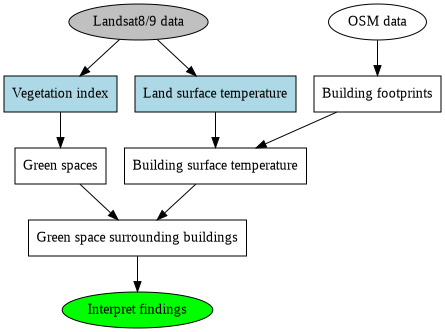

We need to compute for vegetation index and LST from the downloaded raster iamge.

According to GEE, we need to [scale](https://developers.google.com/earth-engine/datasets/catalog/LANDSAT_LC08_C02_T1_L2) or transform the data first before calculating normalized values.

*Why do we need to scale?* Transform digital to physical/real values

In [ ]:
import rasterio
import rasterio.plot
import numpy as np
import matplotlib
import matplotlib.pyplot as plt


# Open the image and print information
# https://geohackweek.github.io/raster/04-workingwithrasters/
image = rasterio.open('/content/drive/MyDrive/gee-api-data-export/L8_first.tif')
print('Image profile:')
pprint.pprint(image.profile)
# Affine transformations involves scale, rotate, translate, mirror and shear on an image
# https://en.wikipedia.org/wiki/Affine_transformation#Image_transformation

# Perform scaling and band math
# https://pygis.io/docs/e_raster_math.html

# Scale red band
L8_red = image.read(1)
L8_red_scaled = L8_red * 0.0000275 - 0.2

# Scale nir band
L8_nir = image.read(2)
L8_nir_scaled = L8_nir * 0.0000275 - 0.2

# NDVI = (nir-red/nir+red)
L8_ndvi_scaled = (L8_nir_scaled - L8_red_scaled) / (L8_nir_scaled + L8_red_scaled)

# Scale LST (in Kelvin)
L8_lst = image.read(3)
L8_lst_scaled = L8_lst * 0.00341802 + 149.0

# LST in Celsius
L8_lst_celsius = L8_lst_scaled - 273.15

Image profile:
{'blockxsize': 256,
 'blockysize': 256,
 'compress': 'lzw',
 'count': 3,
 'crs': CRS.from_epsg(4326),
 'driver': 'GTiff',
 'dtype': 'uint16',
 'height': 443,
 'interleave': 'pixel',
 'nodata': None,
 'tiled': True,
 'transform': Affine(0.00026949458523585647, 0.0, 120.87505884291252,
       0.0, -0.00026949458523585647, 15.547681611427032),
 'width': 802}


Now that we have computed for vegetation index and land surface temperature, let's visualize them.

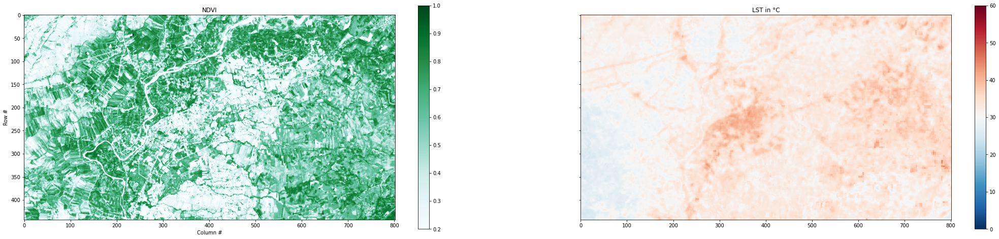

In [ ]:
# Visualize NDVI and LST bands
fig, axes = plt.subplots(1, 2, figsize=(36, 18), sharex=True, sharey=True)

plt.sca(axes[0])
plt.imshow(L8_ndvi_scaled, cmap='BuGn', vmin=0.2, vmax=1)
# More info on NDVI https://gisgeography.com/ndvi-normalized-difference-vegetation-index/
plt.colorbar(shrink=0.45)
plt.title('NDVI')
plt.xlabel('Column #')
plt.ylabel('Row #')

plt.sca(axes[1])
plt.imshow(L8_lst_celsius, cmap='RdBu_r', vmin=0, vmax=60)
plt.colorbar(shrink=0.45)
plt.title('LST in °C')
plt.show()

Cabanatuan City, Nueva Ecija 2022-01-12T10:17:15UTC+8

Built-up areas have low NDVI and usually have higher temperatures than the agricultural areas.

NDVI Classification [ranges](https://www.researchgate.net/figure/NDVI-classification-ranges_tbl1_316471841):
- (-1, 0) -> Water, snow, cloud
- (0, 0.2) -> Barren land, built-up or rock
- (0.2, 1) -> Vegetation

We need to save our computed data as raster files, now with float data types. These files will be used later to extract vegetation and LST on each building footprints.

In [ ]:
new_profile = image.profile.copy()
# change data type to float32 since NDVI and LST have decimal places
new_profile.update({'dtype': 'float32'})

# save new raster files
with rasterio.open('/content/drive/MyDrive/gee-api-data-export/L8_first_ndvi.tif', 'w', **new_profile) as dst:
  dst.write(L8_ndvi_scaled, 1)
with rasterio.open('/content/drive/MyDrive/gee-api-data-export/L8_first_lst.tif', 'w', **new_profile) as dst:
  dst.write(L8_lst_celsius, 1)

# read raster files to be used later
L8_ndvi_scaled_raster_read = rasterio.open('/content/drive/MyDrive/gee-api-data-export/L8_first_ndvi.tif', 'r')
L8_lst_celsius_raster_read = rasterio.open('/content/drive/MyDrive/gee-api-data-export/L8_first_lst.tif', 'r')

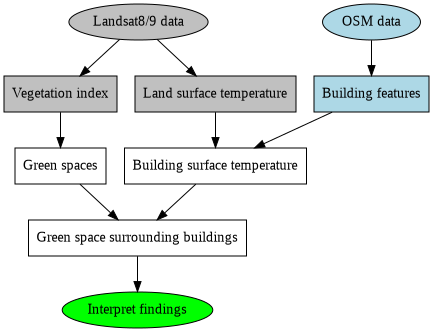

Now, we will get the building footprints on our area of interest from OSM. For that, we will use the `osmnx` library.

In [ ]:
import geopandas as gpd
import utm

import osmnx
osmnx.config(use_cache=True, log_console=True)

from IPython.display import Image

# specify that we're retrieving building footprint geometries
tags = {'building': True}

# download desired data. might take around a minute and a half
buildings_gdf = osmnx.geometries.geometries_from_bbox(b_north, b_south, b_east, b_west, tags)
# uses overpass api, no login needed

# check number of features
print('Number of buildings:', len(buildings_gdf))

#buildings_gdf.plot(edgecolor='red', linewidth=1, figsize=(24, 12))

Number of buildings: 3043


In [ ]:
buildings_gdf.columns

Index(['source', 'geometry', 'building', 'is_in:city', 'name', 'addr:city',
       'addr:street', 'amenity', 'government', 'office', 'opening_hours',
       'townhall:type', 'addr:place', 'man_made', 'denomination', 'religion',
       'addr:postcode', 'name:en', 'addr:housenumber', 'addr:village',
       'emergency', 'nodes', 'contact:email', 'contact:phone', 'healthcare',
       'operator', 'operator:type', 'website', 'shop', 'wikidata', 'wikipedia',
       'building:levels', 'internet_access', 'phone', 'tourism', 'brand',
       'brand:wikidata', 'brand:wikipedia', 'leisure', 'sport', 'atm',
       'cuisine', 'official_name', 'dispensing', 'layer', 'ruins',
       'abandoned:amenity', 'old_name', 'name:abbr', 'alt_name', 'historic',
       'addr:neighbourhood', 'addr:province', 'isced:level',
       'population:pupils:2012', 'population:pupils:2015', 'ref',
       'source:date', 'start_date', 'trade', 'recycling_type', 'club', 'hoops',
       'mapillary', 'admin_level', 'name:tl', 'b

In [ ]:
buildings_gdf['building'].value_counts()

yes             1809
school           916
roof             101
house             36
public            30
residential       24
church            20
commercial        20
retail            14
university        14
chapel             9
apartments         9
hospital           9
warehouse          8
office             7
college            6
civic              4
hotel              2
hangar             1
kindergarten       1
grandstand         1
garage             1
industrial         1
Name: building, dtype: int64

In [ ]:
buildings_gdf['geometry']

element_type  osmid     
node          1331729737                           POINT (120.94909 15.51797)
              1338195292                           POINT (120.96614 15.48678)
              1339187171                           POINT (120.96095 15.48624)
              1956875879                           POINT (120.97707 15.50030)
              1960776138                           POINT (120.96663 15.48744)
                                                  ...                        
way           1093363158    POLYGON ((120.97486 15.48805, 120.97495 15.488...
              1093363159    POLYGON ((120.97514 15.48893, 120.97518 15.489...
relation      3668238       POLYGON ((120.96927 15.47270, 120.96936 15.472...
              8717795       POLYGON ((120.97145 15.48881, 120.97207 15.489...
              13892202      POLYGON ((120.95257 15.45534, 120.95224 15.455...
Name: geometry, Length: 3043, dtype: geometry

In [ ]:
# Initialize interactive map
mapviz = folium.Map(location=[center_lat, center_lon], zoom_start=13)

points = folium.features.GeoJson(buildings_gdf.to_json())
mapviz.add_child(points)

# Add a layer control panel to the map.
mapviz.add_child(folium.LayerControl())

# Wrap map object to figure object to control width and height parameters
mapfig = folium.Figure(width=1024, height=576)
mapfig.add_child(mapviz)

# Display the map.
display(mapfig)

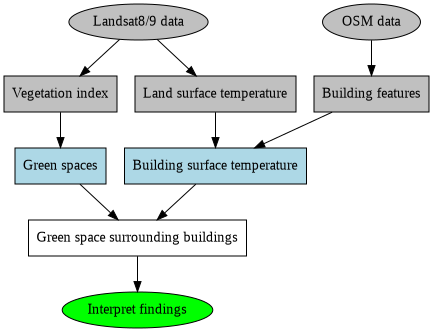

For each building footprint, we will get the vegetation index and LST from our raster datasets.

In [ ]:
# convert to planar coords before getting the centroid
buildings_centroid_xy = buildings_gdf['geometry'].to_crs(32651).centroid

# project back to geog coords then add as field
buildings_centroid_ll = buildings_centroid_xy.to_crs(4326)
buildings_gdf['geometry'] = buildings_centroid_ll

# prepare points to be sampled
coord_list = [(x, y) for x, y in zip(buildings_centroid_ll.x, buildings_centroid_ll.y)]

buildings_gdf['lst'] = [i[0] for i in L8_lst_celsius_raster_read.sample(coord_list)]
buildings_gdf['ndvi'] = [i[0] for i in L8_ndvi_scaled_raster_read.sample(coord_list)]

In [ ]:
# inspect data frame
buildings_gdf.head()

source                    geometry building  \
element_type osmid                                                        
node         1331729737  G-eMapper  POINT (120.94909 15.51797)      yes   
             1338195292        NaN  POINT (120.96614 15.48678)   office   
             1339187171        NaN  POINT (120.96095 15.48624)   public   
             1956875879        NaN  POINT (120.97707 15.50030)      yes   
             1960776138        NaN  POINT (120.96663 15.48744)   office   

                              is_in:city                              name  \
element_type osmid                                                           
node         1331729737  Cabanatuan City                     Reisha Resort   
             1338195292       Cabanatuan        General Luna Barangay Hall   
             1339187171              NaN                     Barangay Hall   
             1956875879       Cabanatuan            Puno's Ice Cream House   
             1960776138              NaN  San Roque Melencio Barangay Hall   

                          addr:city              addr:street   amenity  \
element_type osmid                                                       
node         1331729737         NaN                      NaN       NaN   
             1338195292  Cabanatuan          Gen Luna Street  townhall   
             1339187171         NaN                      NaN  townhall   
             1956875879  Cabanatuan  Maharlika Hi-Way, Bitas       NaN   
             1960776138         NaN                      NaN  townhall   

                             government      office  ... compressed_air  \
element_type osmid                                   ...                  
node         1331729737             NaN         NaN  ...            NaN   
             1338195292  administrative  government  ...            NaN   
             1339187171  administrative  government  ...            NaN   
             1956875879             NaN         NaN  ...            NaN   
             1960776138  administrative  government  ...            NaN   

                        toilets previously smoking addr:country note ways  \
element_type osmid                                                          
node         1331729737     NaN        NaN     NaN          NaN  NaN  NaN   
             1338195292     NaN        NaN     NaN          NaN  NaN  NaN   
             1339187171     NaN        NaN     NaN          NaN  NaN  NaN   
             1956875879     NaN        NaN     NaN          NaN  NaN  NaN   
             1960776138     NaN        NaN     NaN          NaN  NaN  NaN   

                        type        lst      ndvi  
element_type osmid                                 
node         1331729737  NaN  32.456841  0.138124  
             1338195292  NaN  40.167892  0.199518  
             1339187171  NaN  39.549232  0.485779  
             1956875879  NaN  37.426640  0.161344  
             1960776138  NaN  40.848080  0.169802  

[5 rows x 81 columns]

In [ ]:
# save dataframe as a shapefile
buildings_save = buildings_gdf.applymap(lambda x: str(x) if isinstance(x, list) else x)
buildings_save.drop(labels="nodes", axis=1).to_file("/content/drive/MyDrive/gee-api-data-export/buildings.gpkg", driver="GPKG")

# Garbage collection
image = None
L8_lst_celsius_raster_read = None
L8_lst_ndvi_raster_read = None

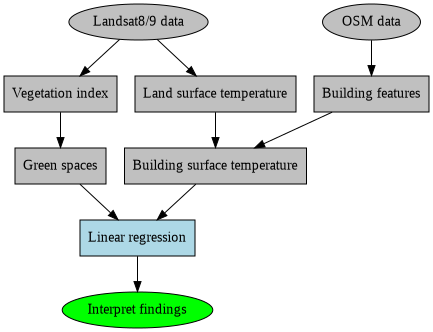

Find a relationship between NDVI (x) and LST (y) from the buildings. We assume that the relationship is *linear*, so we fit a polynomial function with degree 1 on our dataset.

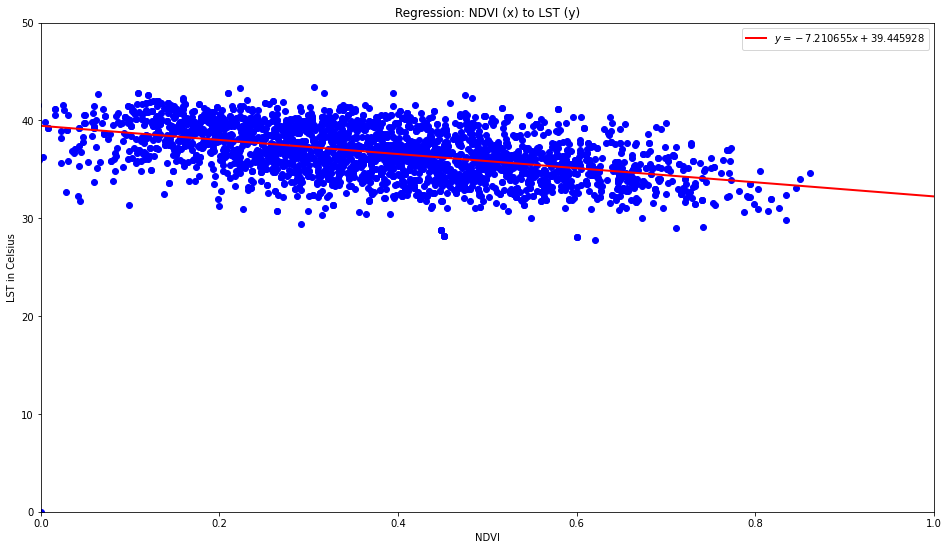

In [ ]:
# Plot data samples
plt.figure(figsize=(16, 9))
plt.xlim(0, 1)
plt.ylim(0, 50)

plt.plot(buildings_gdf['ndvi'], buildings_gdf['lst'], 'bo')

# Fit a line to our dataset. This will return the slope and y-intercept
# Least squares polynomial fit https://numpy.org/doc/stable/reference/generated/numpy.polyfit.html
polyfit = np.polynomial.polynomial.Polynomial.fit(buildings_gdf['ndvi'], buildings_gdf['lst'], deg=1)

# Note that the coefficients are given in the scaled domain defined by the linear mapping between the window and domain. convert can be used to get the coefficients in the unscaled data domain.
# https://numpy.org/doc/stable/reference/routines.polynomials.html#transition-guide
b, m = polyfit.convert()
plt.axline(xy1=(0, b), slope=m, label=f'$y = {m:.6f}x {b:+.6f}$', color='red', linestyle='-', linewidth=2)

# Figure settings
plt.title('Regression: NDVI (x) to LST (y)')
plt.ylabel('LST in Celsius')
plt.xlabel('NDVI')
plt.legend()
plt.show()

Each point represents a building. Our findings are:
- If there are no green space, temperature is estimated at 39&deg;C in Cab City. This is significantly warmer than usual room teperature 25&deg;C. *Keep yourself hydrated!*
- As green space (NDVI) increases, temperature (LST) decreases

# Conclusion

*UHI says that as green space (NDVI) increases, temperature (LST) decreases.* (at least in the study area)

Disclaimers:
* The dataset describes conditions at that instant. If we want to know what happened before or after, the use of CFD software might help
* Factors not taken into account:
  * Building height and material and the ability to absorb and retain heat
  * Atmospheric conditions and disturbances, such as clouds, storm and thunder
  * Elevation and slope
  * Large bodies of water
* *Correlation does not imply causation!* Our findings are subject to further investigation.

## Exercise
Change the area of interest in Baguio City and interpret the results. Boundaries are given [here](https://colab.research.google.com/drive/11DW7baJ-2zF6Jk91sZ5rhRB5pM8wwxuT#scrollTo=KOWl9UfkQ1kL&line=11&uniqifier=1).

- Move all existing files to another directory
- Restart your Colab runtime
- Run all scripts
- Generate the regression graph and interpret results

### Results
- for Cab city we have LST = -7.210655*(NDVI) + 39.445928
- and for Baguio we have LST = -9.039582*(NDVI) + 32.342325
- significantly mas mababa yung "default" urban heat temperature sa Baguio city (32 vs 39)
- we also have higher "cooling" rate induced by green spaces in Baguio city (-9 vs -7)

*reason why marami umaakyat sa Baguio*